In [52]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import methyltree 
import scanpy as sc
import cospar as cs
from matplotlib import cbook, cm, colors, rcParams
from collections import Counter

data_dir='.'
rcParams["axes.spines.right"] = False
rcParams["axes.spines.top"] = False
rcParams["font.size"] = 13
# %config InlineBackend.figure_format = 'svg' #'retina'         # or 'svg'
pd.set_option('display.max_columns', 100)
pd.set_option('display.max_rows', 10)

import logging
logging.getLogger('fontTools').setLevel(logging.WARNING)

cs.settings.set_figure_params()

# Explanation

## Data Sources

This study used publicly available **EPI-Clone** datasets:

- **CpG selection file** (`cpg_selection`), downloaded from the [EPI-Clone GitHub repository](https://github.com/veltenlab/EPI-clone/blob/main/figures/Figure1/cpg_selection.csv), which annotates CpG sites as *static* or *dynamic*.  
- **Single-cell DNA methylation data** (`Figure1_larry_DNAm`), downloaded from [Figshare](https://figshare.com/articles/dataset/EPI-Clone_dataset_Single_cell_targeted_DNA_methylation_profiling_of_hematopoietic_stem_and_progenitor_cells/24204750?file=42479346) and converted into **AnnData** format using *SaveH5Seurat*.  

Among the four experiments contained in `Figure1_larry_DNAm`, the **LARRY_mouse1** dataset was extracted and used as input for **MethylTree** analysis. In this analysis, `CellType` was used as the `cell_type_key` and `LARRY` as the `clone_key` in MethylTree.

---

## Analysis

**MethylTree** was applied to the **EPI-Clone** dataset to evaluate clonal inference under different CpG selections and signal correction settings:

1. **Clone size distribution** was assessed for *LARRY_mouse1*.  
2. **All CpGs (453 sites):** MethylTree analysis was performed both with and without cell-type signal removal. Clonal inference accuracy was evaluated across clone sizes and compared against the cutoff of 9 used in the EPI-Clone study.  
3. **Static CpGs (110 sites):** MethylTree analysis using only static sites.  
4. **Dynamic CpGs (343 sites):** MethylTree analysis using only dynamic sites.  

---

## Results

- **Using all CpGs (without applying the clone-size cutoff)**  
  - Without removing cell-type signal: accuracy = **0.41**  
  - With cell-type signal removal: accuracy = **0.56**  


- **After applying the EPI-Clone cutoff (minimum clone size = 9)**  
  - Without removing cell-type signal: accuracy = **0.46**  
  - With cell-type signal removal: accuracy = **0.66**  

- **Using static CpGs alone (without applying the clone-size cutoff)**: accuracy = **0.655**, comparable to the all-CpG analysis with signal correction.  
- **Using dynamic CpGs alone (without applying the clone-size cutoff)**: accuracy = **0.07** (very low).  

---

## Conclusion

MethylTree can be effectively applied to the EPI-Clone dataset. It achieves higher clonal inference accuracy when cell-type signals are removed or when static CpGs are used, demonstrating good applicability and robustness across different experimental settings.

---

## Across all EPI-Clone datasets

- **Using MethylTree to analyze all EPI-Clone datasets**
  - Under the **transplantation** condition, clonal reconstruction results were the most reliable.  
  - Under the **aging** condition, lineage reconstruction was less accurate, particularly for younger individuals (both mouse and human).  

---

## Reference

Fu R, Chen M, WangS‐W. DNA methylation meets lineage tracing:history, recent progress, and future directions.Quantitative Biology. 2026;e70017. https://doi.org/10.1002/qub2.70017

# Transplanted mice

In [53]:
cpg_selection = pd.read_csv(f'cpg_selection.csv',index_col=0)

In [54]:
Figure1_larry_DNAm = sc.read(f'{data_dir}/Figure1_larry_DNAm.h5ad')

# LARRY_mouse1

In [55]:
adata_mouse1 = Figure1_larry_DNAm[Figure1_larry_DNAm.obs['ProcessingBatch']=='LARRY_mouse1']

In [56]:
sel_idx=adata_mouse1.obs['LARRY']=='NA'
adata_mouse1.obs.loc[sel_idx,'LARRY']='nan'


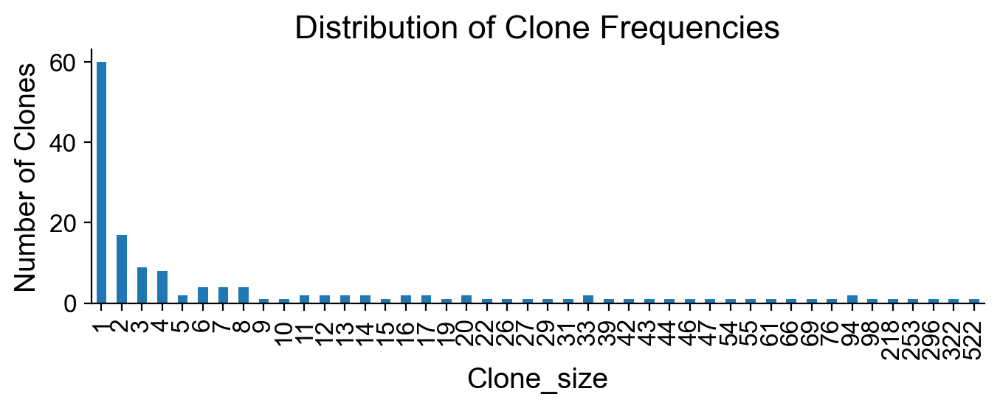

In [57]:
cs.settings.set_figure_params()

label_counts = adata_mouse1.obs['LARRY'].value_counts()

count_distribution = label_counts.value_counts().sort_index()

plt.figure(figsize=(7, 3))
count_distribution.plot(kind='bar')

plt.xlabel('Clone_size', fontsize=14) #Number of Cells per LARRY label
plt.ylabel('Number of Clones', fontsize=14) #Number of LARRY labels
plt.title('Distribution of Clone Frequencies', fontsize=16) #Distribution of LARRY label Frequencies

plt.xticks(rotation=90, fontsize=12)
plt.yticks(fontsize=12)

plt.tight_layout()

plt.savefig("Clone_frequency_distribution.png", dpi=600)

plt.show()


In [58]:
non_na_larry = adata_mouse1.obs['LARRY']
non_na_larry = non_na_larry[non_na_larry.notna() & (non_na_larry != 'nan')]

sorted_labels = non_na_larry.value_counts().index.tolist()

label_to_clone = {label: f'Clone_{i+1}' for i, label in enumerate(sorted_labels)}

adata_mouse1.obs['Clone'] = pd.NA

adata_mouse1.obs.loc[adata_mouse1.obs['LARRY'].notna(), 'Clone'] = (
    adata_mouse1.obs.loc[adata_mouse1.obs['LARRY'].notna(), 'LARRY'].map(label_to_clone)
)


## Similarity matrix from using all CpGs before removing cell-type signal
Showing the noise-corrected similarity matrix

use provided adata
adata shape:  (3246, 453)
X_similarity_correlation_fast_raw not found in adata.obsm
re-compute similarity matrix
Use correlation_fast for similarity
duration: 0.26692986488342285
correct similarity: outer loop 0;  current epsilon 0.05
Use fast/analytical correction method


  3%|█▏                                       | 28/1000 [00:05<03:03,  5.30it/s]


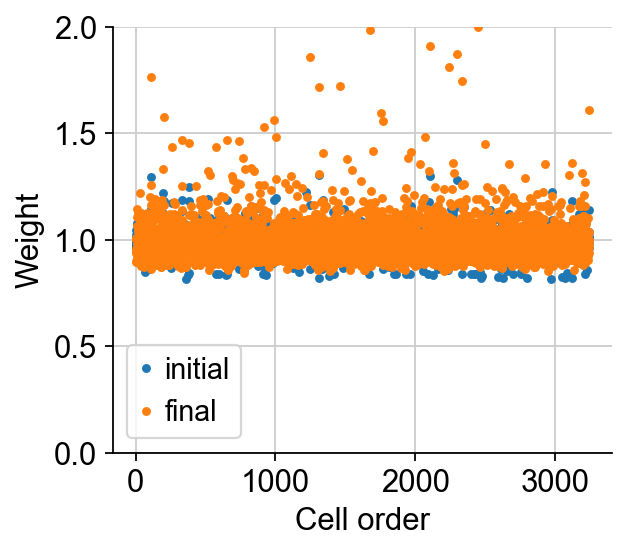

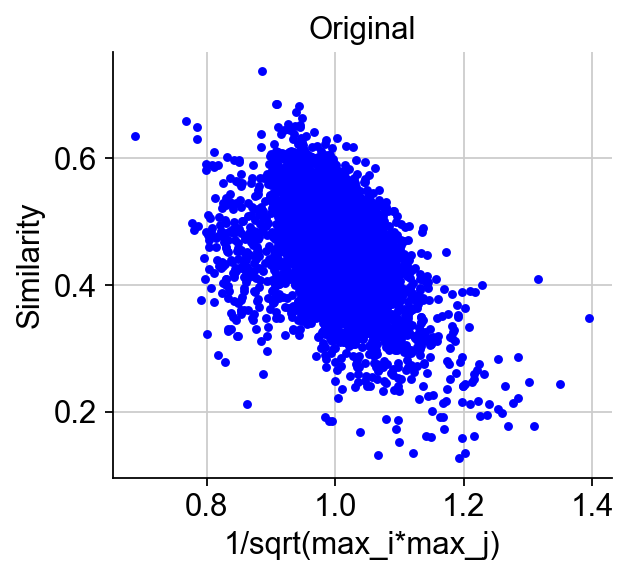

std: 0.056
similarity normalize----


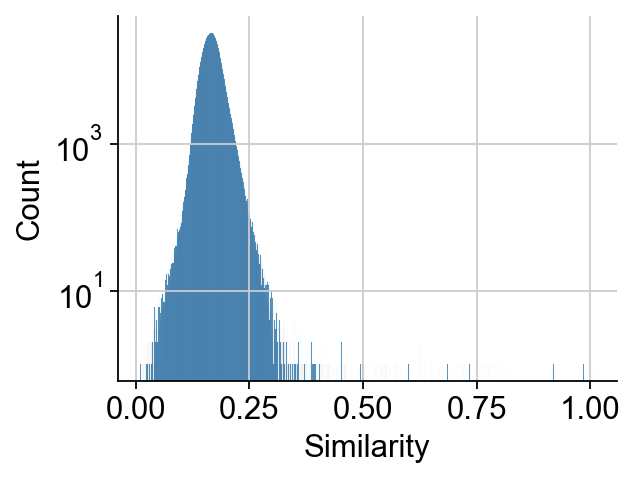

Reconstruction method: UPGMA
      clone  clone_size  accuracy  continuity   entropy  wassertein  \
0   Clone_1         322  0.201863    0.903727  0.422054    0.338509   
1  Clone_10          66  0.393939    0.833333  0.382052    0.606061   
2  Clone_11          61  0.295082    0.721311  0.595826    0.245902   
3  Clone_12          55  0.163636    0.581818  0.683013    0.509091   
4  Clone_13          54  0.296296    0.740741  0.525736    0.388889   

   random_accuracy  random_continuity  random_entropy  random_wassertein  
0         0.010870           0.126398        0.968828           0.839130  
1         0.031818           0.045455        0.989784           0.910606  
2         0.022951           0.037705        0.992813           0.916393  
3         0.032727           0.040000        0.992452           0.916364  
4         0.025926           0.037037        0.993564           0.918519  
mean continuity: 0.6423837522346083
mean accuracy: 0.4079262581051974
mean entropy: 0.59648372

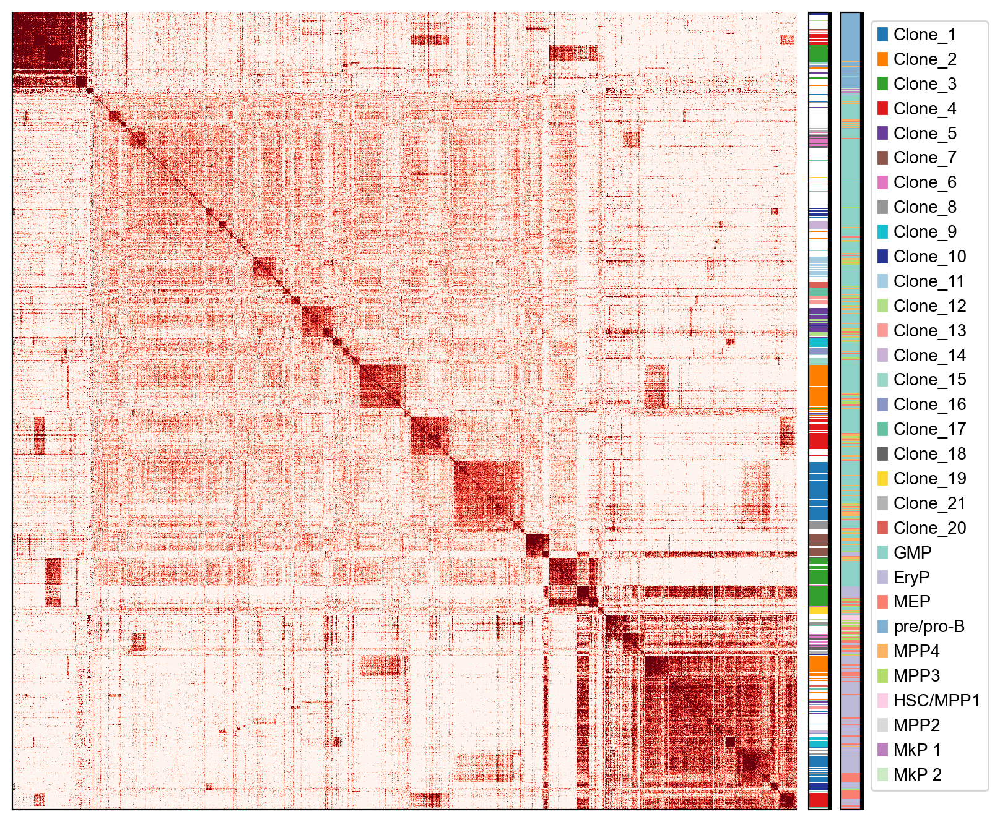

In [59]:
adata_mouse1_allCpGs,my_tree=methyltree.analysis.comprehensive_lineage_analysis('data','data','Figure1_larry_DNAm_LARRY_mouse1','Clone',adata_orig=adata_mouse1,
                                                                        fig_dir = 'pic',
                                                        update_sample_info=False,heatmap_figsize = (8, 7.5),
                                                        heatmap_additional_key_list=['CellType'],similarity_method='correlation_fast',
                                                        heatmap_show_label=False,similarity_correction=True)

In [ ]:
clone_key = 'Clone'
order_x = adata_mouse1_allCpGs.uns['order_x']
ordered_clone_array = np.array(adata_mouse1_allCpGs.obs[clone_key])[order_x].astype(str)

valid_clone_array = ordered_clone_array[
    (~pd.isna(ordered_clone_array)) & (ordered_clone_array != 'nan')
]

clone_counts = Counter(valid_clone_array)

cutoff_list = []
mean_accuracy_list = []
number_clone_list = []

for cutoff in sorted(set(clone_counts.values()), reverse=False):
    if cutoff < 2:
        continue

    print(f"\nCutoff: ≥{cutoff}")

    valid_clones = {clone for clone, count in clone_counts.items() if count >= cutoff}

    if len(valid_clones) < 2:
        print("Too few clones, skipping...")
        continue

    ordered_clone_array_tmp = ordered_clone_array[np.isin(ordered_clone_array, list(valid_clones))]

    df_accuracy = methyltree.metric.lineage_accuracy_from_leaf_order(ordered_clone_array_tmp)
    df_accuracy = df_accuracy.sort_values("clone_size", ascending=False)

    print(f"Evaluate on {len(df_accuracy)} clones")
    mean_accuracy = df_accuracy['accuracy'].mean()
    print(f"Mean Accuracy: {mean_accuracy:.4f}")

    cutoff_list.append(cutoff)
    mean_accuracy_list.append(mean_accuracy)
    number_clone_list.append(len(valid_clones))


In [13]:
cutoff_list.append(322)
mean_accuracy_list.append(1)
number_clone_list.append(1)

In [14]:
adata_mouse1_allCpGs.X.shape[0]*0.0025

8.115

In [15]:
df_cutoff_stats = pd.DataFrame({
    'cutoff': cutoff_list,
    'mean_accuracy': mean_accuracy_list,
    'num_clones': number_clone_list
})

df_cutoff_stats.to_csv('pic/Larry_mouse1_allCpG_raw_cutoff_vs_accuracy.csv', index=False)

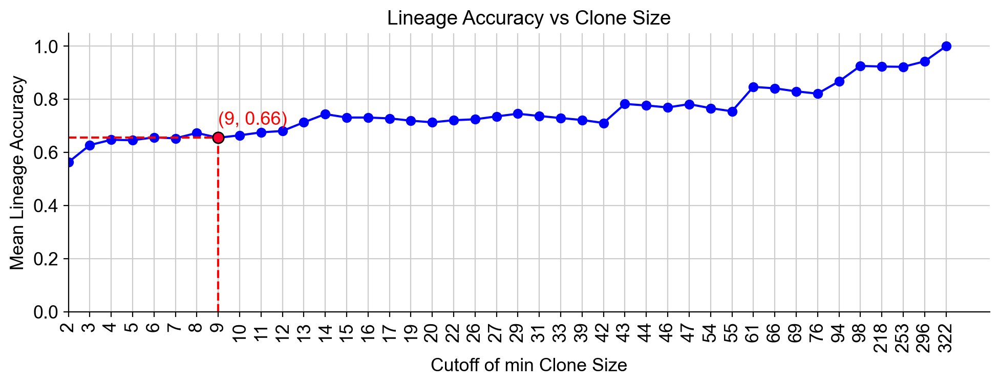

<Figure size 600x400 with 0 Axes>

In [61]:
cs.settings.set_figure_params()

cutoff_list = [
 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17,
 19, 20, 22, 26, 27, 29, 31, 33, 39, 42, 43, 44, 46, 47,
 54, 55, 61, 66, 69, 76, 94, 98, 218, 253, 296, 322
]

x_positions = list(range(len(cutoff_list)))
highlight_cutoff = 9

if highlight_cutoff in cutoff_list:
    idx = cutoff_list.index(highlight_cutoff)
    x_val = x_positions[idx]
    y_val = mean_accuracy_list[idx]

    plt.figure(figsize=(10, 4))
    plt.plot(x_positions, mean_accuracy_list, color='#0000FF', marker='o')

    plt.scatter(x_val, y_val, color='#FF0033', edgecolors='black', zorder=5, s=60)
    
    plt.plot([x_val, x_val], [0, y_val], linestyle='--', color='red')
    plt.plot([0, x_val], [y_val, y_val], linestyle='--', color='red')

    plt.text(x_val, y_val + 0.05, f'({cutoff_list[idx]}, {y_val:.2f})', color='red', fontsize=13)


    plt.xticks(ticks=x_positions, labels=cutoff_list, rotation=90)
    plt.xlim(left=0) 
    plt.ylim(bottom=0)  

    plt.xlabel('Cutoff of min Clone Size')
    plt.ylabel('Mean Lineage Accuracy')
    plt.title('Lineage Accuracy vs Clone Size')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

else:
    print("Cutoff = 9 not found in cutoff_list.")

plt.savefig("pic/Larry_mouse1_allCpG_accuracy.png", dpi=600)

## Similarity matrix from using all CpG and after removing celltype signal

use provided adata
adata shape:  (3246, 453)
correct similarity: outer loop 0;  current epsilon 0.05
Use fast/analytical correction method


  3%|█▏                                       | 28/1000 [00:05<03:14,  5.01it/s]


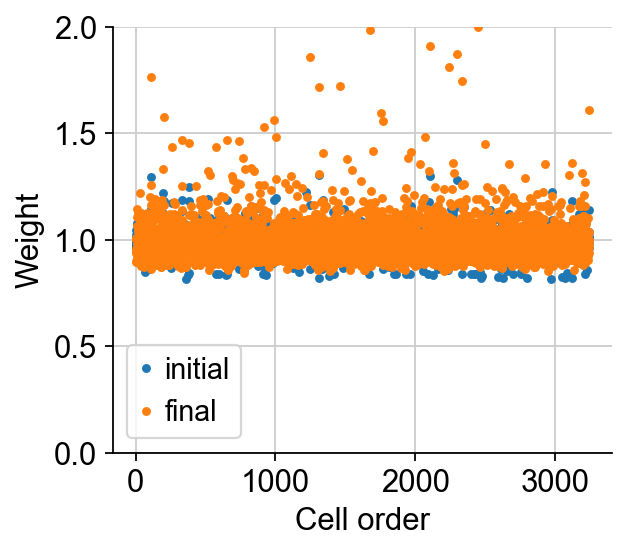

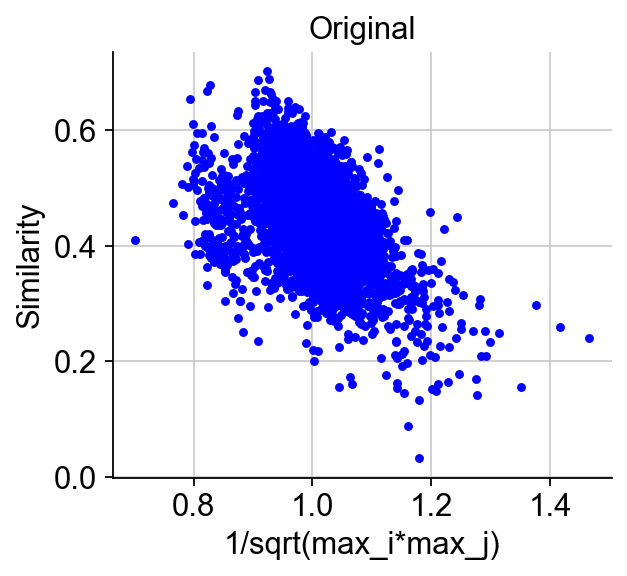

std: 0.056
Remove cell-type signal with fast method
similarity normalize----


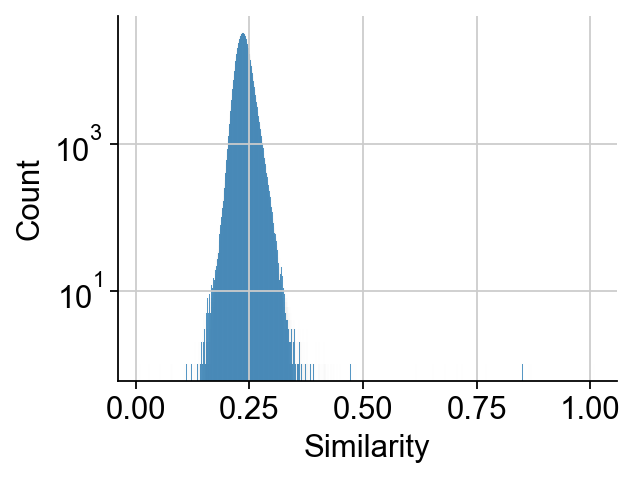

Reconstruction method: UPGMA
      clone  clone_size  accuracy  continuity   entropy  wassertein  \
0   Clone_1         322  0.546584    0.913043  0.260564    0.083851   
1  Clone_10          66  0.954545    0.954545  0.056053    0.045455   
2  Clone_11          61  0.295082    0.704918  0.576043    0.196721   
3  Clone_12          55  0.254545    0.600000  0.660250    0.363636   
4  Clone_13          54  0.574074    0.888889  0.307206    0.092593   

   random_accuracy  random_continuity  random_entropy  random_wassertein  
0         0.010559           0.120497        0.970409           0.838199  
1         0.024242           0.037879        0.992480           0.907576  
2         0.022951           0.031148        0.995025           0.901639  
3         0.029091           0.038182        0.993081           0.918182  
4         0.022222           0.035185        0.994208           0.918519  
mean continuity: 0.7119154340664986
mean accuracy: 0.5629912435517358
mean entropy: 0.46976096

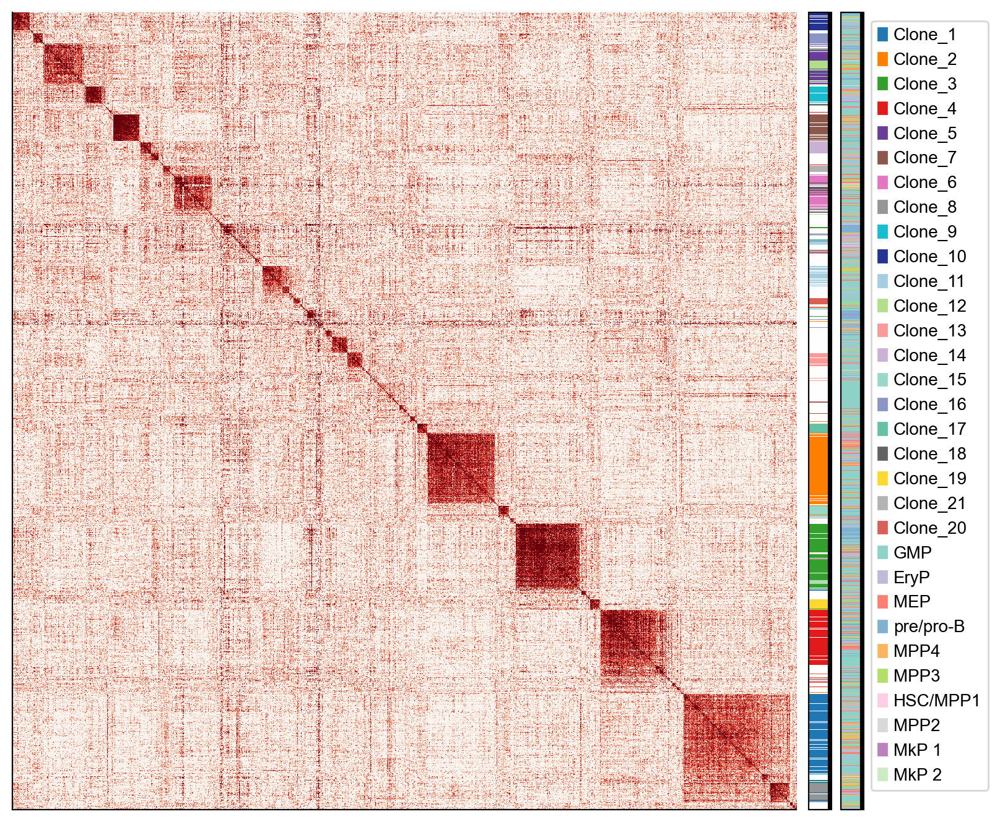

In [62]:
adata_mouse1_allCpGs_remove_celltype_signals,my_tree=methyltree.analysis.comprehensive_lineage_analysis('data','data','Figure1_larry_DNAm_LARRY_mouse1','Clone',adata_orig=adata_mouse1_allCpGs,
                                                                                                fig_dir = 'pic',
                                                        update_sample_info=False,heatmap_figsize = (8, 7.5),
                                                        heatmap_additional_key_list=['CellType'],similarity_method='correlation_fast',remove_celltype_signal=True,cell_type_key='CellType',
                                                        heatmap_show_label=False,similarity_correction=True)

In [ ]:
clone_key = 'Clone'
order_x = adata_mouse1_allCpGs_remove_celltype_signals.uns['order_x']
ordered_clone_array = np.array(adata_mouse1_allCpGs_remove_celltype_signals.obs[clone_key])[order_x].astype(str)

valid_clone_array = ordered_clone_array[
    (~pd.isna(ordered_clone_array)) & (ordered_clone_array != 'nan')
]

clone_counts = Counter(valid_clone_array)

cutoff_list = []
mean_accuracy_list = []
number_clone_list = []

for cutoff in sorted(set(clone_counts.values()), reverse=False):
    if cutoff < 2:
        continue

    print(f"\nCutoff: ≥{cutoff}")

    valid_clones = {clone for clone, count in clone_counts.items() if count >= cutoff}

    if len(valid_clones) < 2:
        print("Too few clones, skipping...")
        continue

    ordered_clone_array_tmp = ordered_clone_array[np.isin(ordered_clone_array, list(valid_clones))]

    df_accuracy = methyltree.metric.lineage_accuracy_from_leaf_order(ordered_clone_array_tmp)
    df_accuracy = df_accuracy.sort_values("clone_size", ascending=False)

    print(f"Evaluate on {len(df_accuracy)} clones")
    mean_accuracy = df_accuracy['accuracy'].mean()
    print(f"Mean Accuracy: {mean_accuracy:.4f}")

    cutoff_list.append(cutoff)
    mean_accuracy_list.append(mean_accuracy)
    number_clone_list.append(len(valid_clones))


In [19]:
cutoff_list.append(322)
mean_accuracy_list.append(1)
number_clone_list.append(1)

In [20]:
adata_mouse1_allCpGs_remove_celltype_signals.X.shape[0]*0.0025

8.115

In [21]:
df_cutoff_stats = pd.DataFrame({
    'cutoff': cutoff_list,
    'mean_accuracy': mean_accuracy_list,
    'num_clones': number_clone_list
})

df_cutoff_stats.to_csv('pic/Larry_mouse1_allCpG_remove_celltype_cutoff_vs_accuracy.csv', index=False)

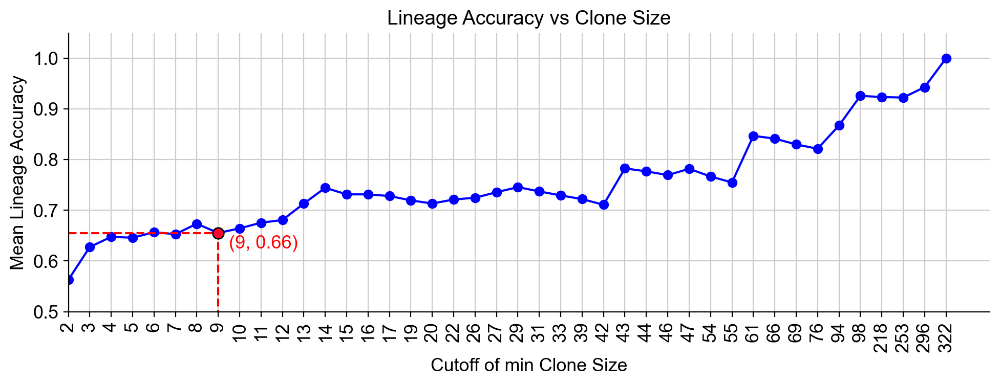

<Figure size 600x400 with 0 Axes>

In [65]:
cs.settings.set_figure_params()

cutoff_list = [
 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17,
 19, 20, 22, 26, 27, 29, 31, 33, 39, 42, 43, 44, 46, 47,
 54, 55, 61, 66, 69, 76, 94, 98, 218, 253, 296, 322
]

x_positions = list(range(len(cutoff_list)))
highlight_cutoff = 9

if highlight_cutoff in cutoff_list:
    idx = cutoff_list.index(highlight_cutoff)
    x_val = x_positions[idx]
    y_val = mean_accuracy_list[idx]

    plt.figure(figsize=(10, 4))
    plt.plot(x_positions, mean_accuracy_list, color='#0000FF', marker='o')

    plt.scatter(x_val, y_val, color='#FF0033', edgecolors='black', zorder=5, s=60)
    
    plt.plot([x_val, x_val], [0, y_val], linestyle='--', color='red')
    plt.plot([0, x_val], [y_val, y_val], linestyle='--', color='red')

    plt.text(x_val + 0.5, y_val - 0.03, f'({cutoff_list[idx]}, {y_val:.2f})', color='red', fontsize=13)


    plt.xticks(ticks=x_positions, labels=cutoff_list, rotation=90)
    plt.xlim(left=0) 
    plt.ylim(bottom=0.5) 

    plt.xlabel('Cutoff of min Clone Size')
    plt.ylabel('Mean Lineage Accuracy')
    plt.title('Lineage Accuracy vs Clone Size')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

else:
    print("Cutoff = 9 not found in cutoff_list.")

plt.savefig("pic/Larry_mouse1_allCpG_accuracy_Remove_CellType_Signals.png", dpi=600)

## Similarity matrix from only dynamic CpGs
Showing the noise-corrected matrix, and without removing cell type signals

In [66]:
adata_mouse1_dynamic = adata_mouse1[:, adata_mouse1.var_names.isin(
    cpg_selection[cpg_selection['Type'] == 'Dynamic']['CpG'].to_list()
)]

use provided adata
adata shape:  (3246, 343)
X_similarity_correlation_fast_raw not found in adata.obsm
re-compute similarity matrix
Use correlation_fast for similarity
duration: 0.2605628967285156
correct similarity: outer loop 0;  current epsilon 0.05
Use fast/analytical correction method


  3%|█▏                                       | 28/1000 [00:05<03:23,  4.77it/s]


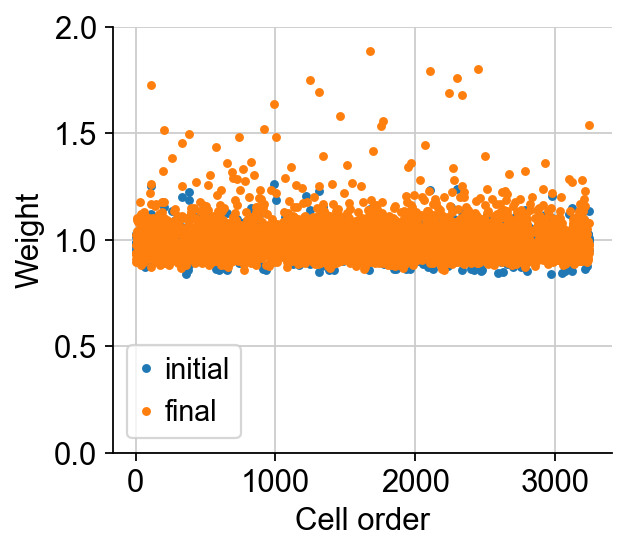

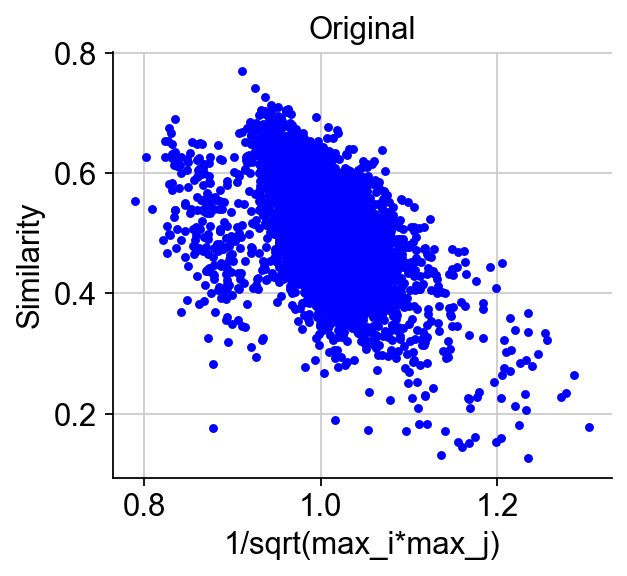

std: 0.061
similarity normalize----


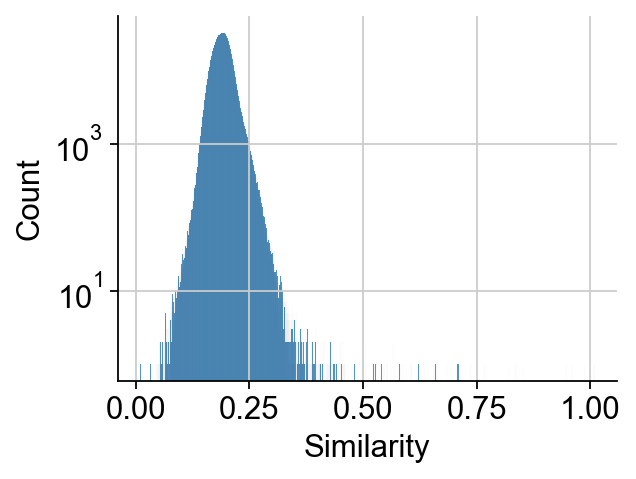

Reconstruction method: UPGMA
      clone  clone_size  accuracy  continuity   entropy  wassertein  \
0   Clone_1         322  0.118012    0.521739  0.775799    0.698758   
1  Clone_10          66  0.030303    0.181818  0.944852    0.878788   
2  Clone_11          61  0.049180    0.213115  0.929487    0.868852   
3  Clone_12          55  0.054545    0.200000  0.934728    0.854545   
4  Clone_13          54  0.037037    0.074074  0.980693    0.870370   

   random_accuracy  random_continuity  random_entropy  random_wassertein  
0         0.009938           0.118944        0.971179           0.840994  
1         0.018182           0.033333        0.993984           0.907576  
2         0.027869           0.049180        0.988735           0.911475  
3         0.029091           0.036364        0.993710           0.916364  
4         0.033333           0.055556        0.987128           0.920370  
mean continuity: 0.28686668196776277
mean accuracy: 0.06963450767838045
mean entropy: 0.949528

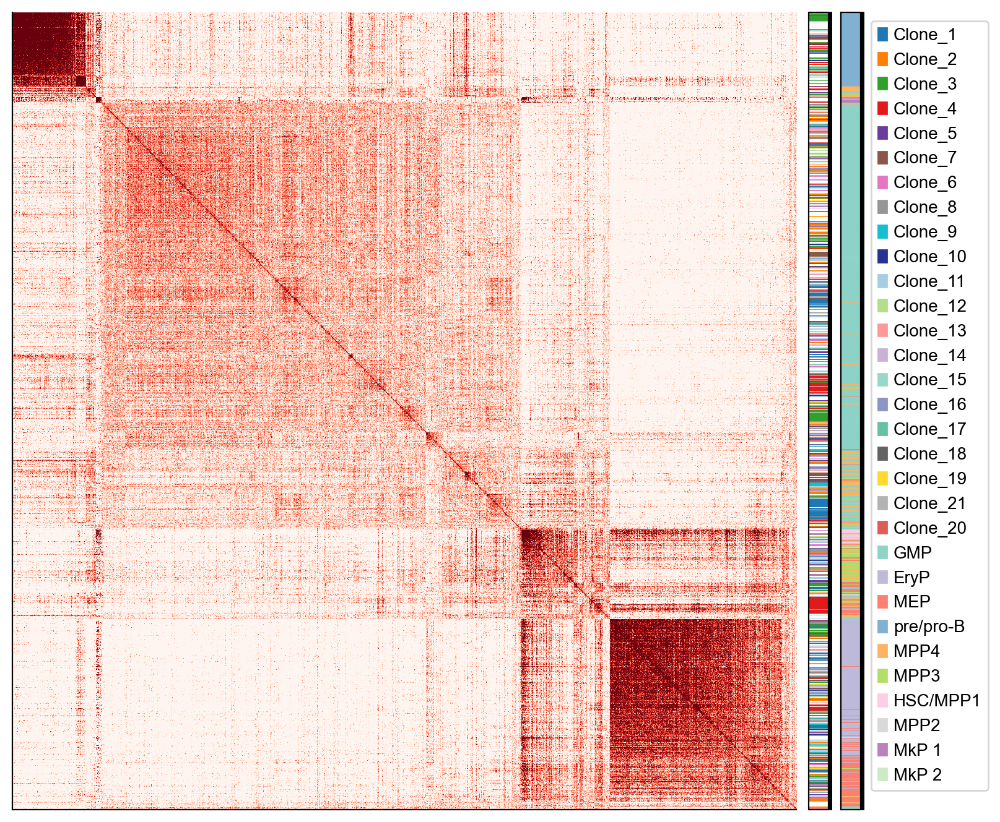

In [67]:
adata_mouse1_dynamic,my_tree=methyltree.analysis.comprehensive_lineage_analysis('data','data','Figure1_larry_DNAm_LARRY_mouse1','Clone',adata_orig=adata_mouse1_dynamic,
                                                                        fig_dir = 'pic',
                                                        update_sample_info=False,heatmap_figsize = (8, 7.5),
                                                        heatmap_additional_key_list=['CellType'],similarity_method='correlation_fast',
                                                        heatmap_show_label=False,similarity_correction=True)

## Similarity matrix from only the static CpGs
Showing the noise-corrected similarity matrix and without removing cell-type signals

In [68]:
adata_mouse1_static = adata_mouse1[:, adata_mouse1.var_names.isin(
    cpg_selection[cpg_selection['Type'] == 'Static']['CpG'].to_list()
)]

use provided adata
adata shape:  (3246, 110)
X_similarity_correlation_fast_raw not found in adata.obsm
re-compute similarity matrix
Use correlation_fast for similarity
duration: 0.29906415939331055
correct similarity: outer loop 0;  current epsilon 0.05
Use fast/analytical correction method


  0%|▏                                         | 5/1000 [00:01<03:39,  4.53it/s]


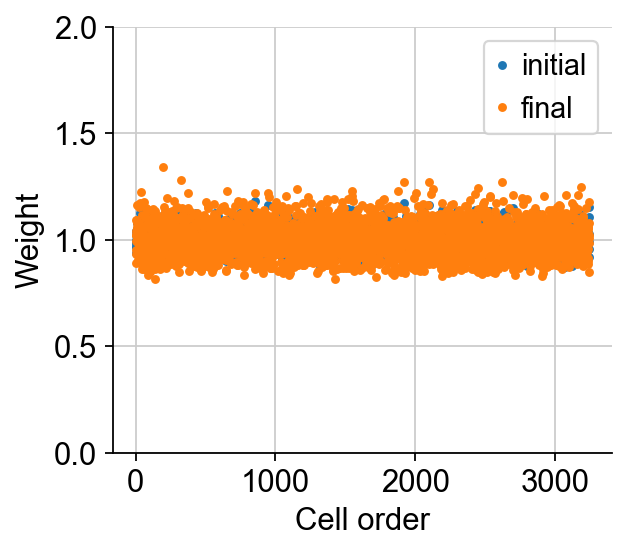

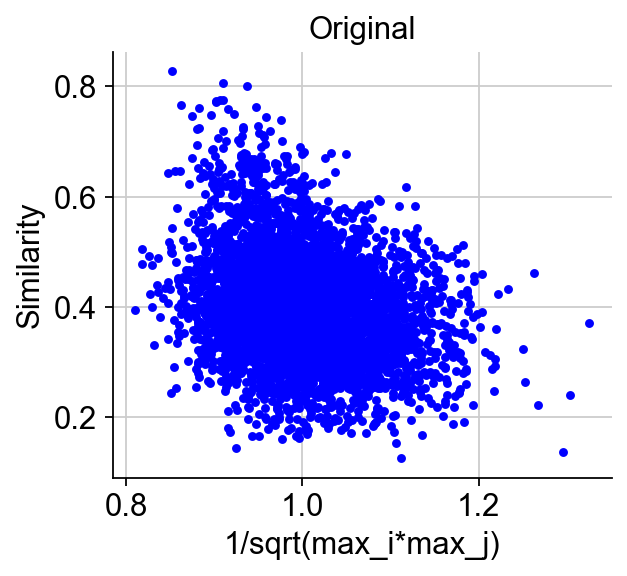

std: 0.044
similarity normalize----


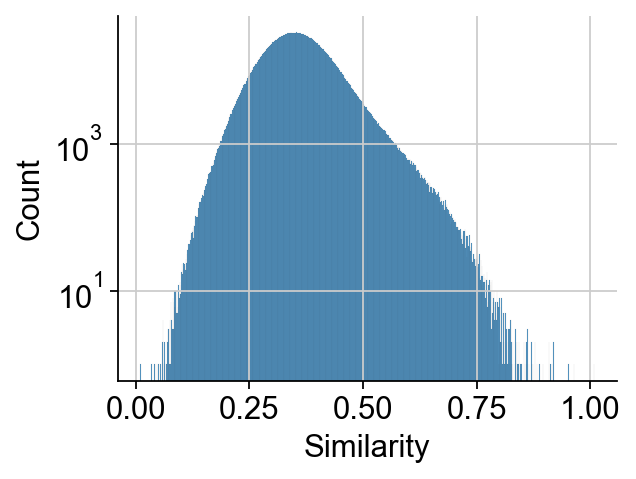

Reconstruction method: UPGMA
      clone  clone_size  accuracy  continuity   entropy  wassertein  \
0   Clone_1         322  0.760870    0.950311  0.175613    0.043478   
1  Clone_10          66  0.939394    0.969697  0.062705    0.015152   
2  Clone_11          61  0.278689    0.803279  0.481714    0.180328   
3  Clone_12          55  0.327273    0.727273  0.525981    0.309091   
4  Clone_13          54  0.500000    0.925926  0.276555    0.055556   

   random_accuracy  random_continuity  random_entropy  random_wassertein  
0         0.009938           0.129193        0.968484           0.841925  
1         0.024242           0.039394        0.991979           0.915152  
2         0.016393           0.039344        0.992260           0.914754  
3         0.027273           0.045455        0.990328           0.914545  
4         0.018519           0.029630        0.996139           0.903704  
mean continuity: 0.7883323004804682
mean accuracy: 0.6553322770328721
mean entropy: 0.36634685

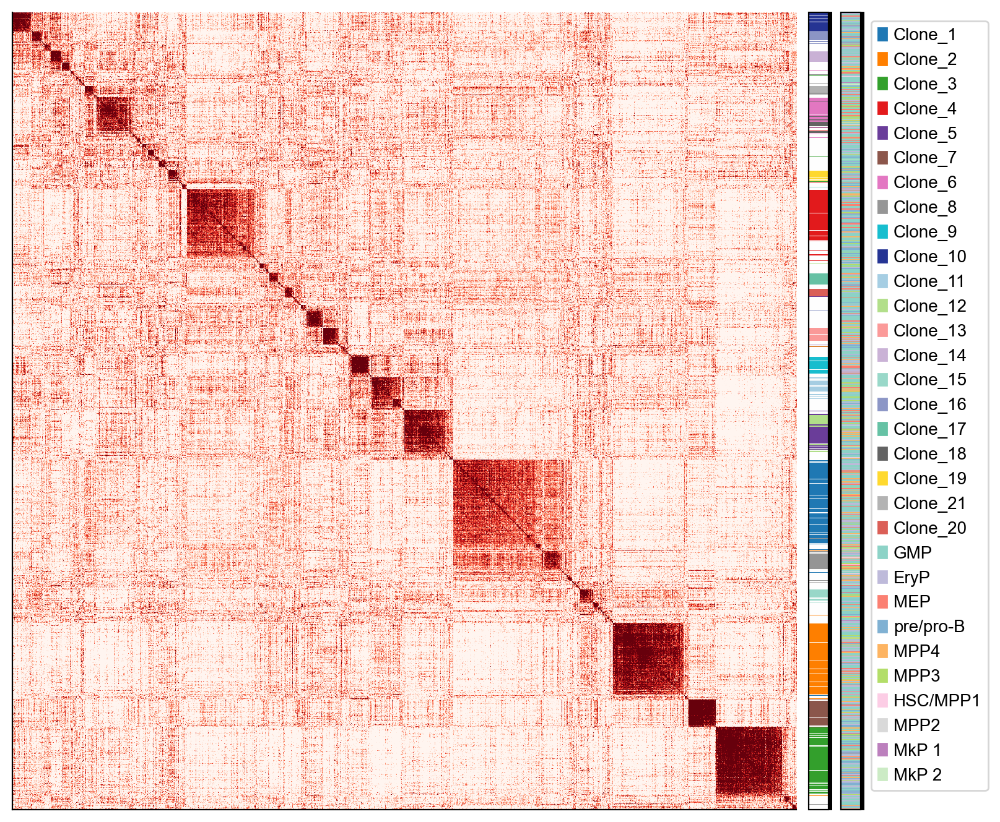

In [69]:
adata_mouse1_static,my_tree=methyltree.analysis.comprehensive_lineage_analysis('data','data','Figure1_larry_DNAm_LARRY_mouse1','Clone',adata_orig=adata_mouse1_static,
                                                                        fig_dir = 'pic',
                                                        update_sample_info=False,heatmap_figsize = (8, 7.5),
                                                        heatmap_additional_key_list=['CellType'],similarity_method='correlation_fast',
                                                        heatmap_show_label=False,similarity_correction=True)